# YOLO: You Only Look Once
## Unified, Real-Time Object Detection

**Paper:** Joseph Redmon, Santosh Divvala, Ross Girshick, Ali Farhadi (2016)

---

### Presentation Outline
1. Introduction & Motivation
2. YOLO's Core Insight
3. Architecture Overview
4. Prediction Tensor Explained
5. Training & Loss Function
6. Inference Pipeline
7. Confidence Filtering
8. Non-Maximum Suppression
9. Complete Example
10. Results & Metrics
11. Limitations & Future Work

---
## 3. Architecture Overview

### Network Structure

**YOLOv1 Architecture:**
- **Input:** $448 \times 448 \times 3$ RGB image
- **Backbone:** 24 convolutional layers (inspired by GoogLeNet)
- **Detection Head:** 2 fully connected layers
- **Output:** $7 \times 7 \times 30$ tensor

**Architecture Flow:**

$$
448 \times 448 \times 3 \xrightarrow{\text{Conv Layers}} 7 \times 7 \times 1024 \xrightarrow{\text{FC Layers}} 7 \times 7 \times 30
$$

**Key Features:**
- Pretrained on ImageNet (classification task)
- Fine-tuned on detection dataset
- Fast inference: single forward pass

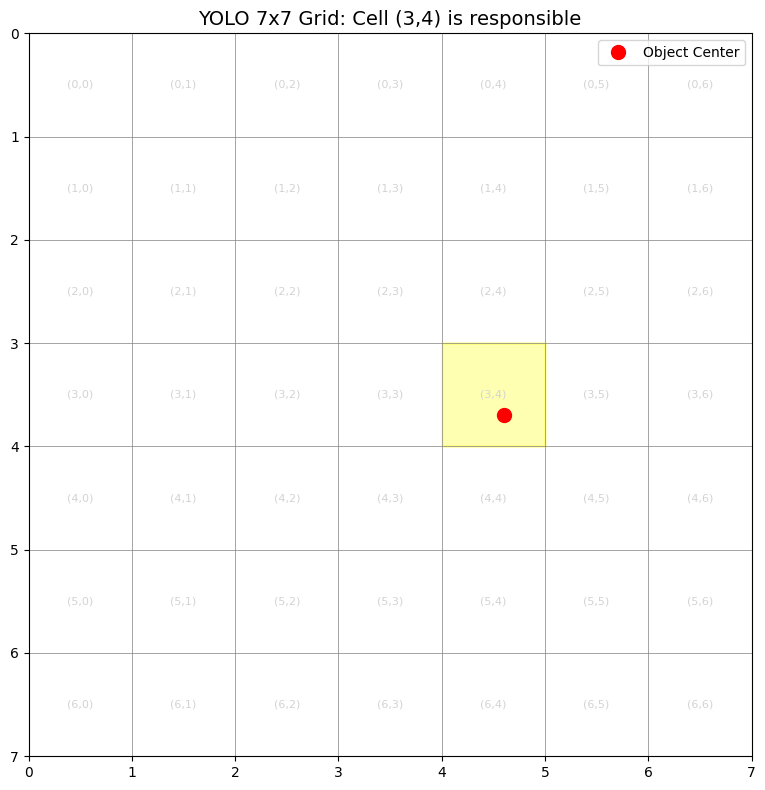

Total grid cells: 7x7 = 49
This cell (3,4) will predict bounding boxes for any object whose center falls within it


In [1]:
# Setup: Import libraries and define helper functions
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch

# Create a sample grid visualization
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
S = 7

# Draw grid
for i in range(S + 1):
    ax.axhline(i, color='gray', linewidth=0.5)
    ax.axvline(i, color='gray', linewidth=0.5)

# Add cell labels
for i in range(S):
    for j in range(S):
        ax.text(j + 0.5, i + 0.5, f'({i},{j})', 
                ha='center', va='center', fontsize=8, color='lightgray')

# Example: highlight a cell and show object center
example_cell = (3, 4)
rect = patches.Rectangle((example_cell[1], example_cell[0]), 1, 1, 
                          linewidth=2, edgecolor='yellow', facecolor='yellow', alpha=0.3)
ax.add_patch(rect)

# Add object center point
center_x, center_y = example_cell[1] + 0.6, example_cell[0] + 0.7
ax.plot(center_x, center_y, 'ro', markersize=10, label='Object Center')

ax.set_xlim(0, S)
ax.set_ylim(0, S)
ax.set_aspect('equal')
ax.invert_yaxis()
ax.set_title('YOLO 7x7 Grid: Cell (3,4) is responsible', fontsize=14)
ax.legend()
plt.tight_layout()
plt.show()

print(f"Total grid cells: {S}x{S} = {S*S}")
print("This cell (3,4) will predict bounding boxes for any object whose center falls within it")

### Visual Demonstration: Grid Division

In [2]:
from manim import (
    BLUE,  # noqa: F401
    DOWN,
    GRAY,
    GRAY_B,  # noqa: F401
    GRAY_C,
    GREEN,  # noqa: F401
    LEFT,
    ORANGE,  # noqa: F401
    PINK,  # noqa: F401
    PURPLE,  # noqa: F401
    RED,
    RIGHT,
    UL,
    UP,
    WHITE,
    YELLOW,
    Arrow,
    Brace,  # noqa: F401
    Create,
    DashedLine,  # noqa: F401
    Dot,
    FadeIn,
    FadeOut,  # noqa: F401
    FadeToColor,  # noqa: F401
    Flash,
    Line,  # noqa: F401
    Rectangle,
    Scene,
    Square,
    Text,
    TransformFromCopy,  # noqa: F401
    VGroup,
    Wiggle,  # noqa: F401
    Write,
    config,
)

# Configure Manim for notebook rendering
config.media_width = "100%"  # Width of rendered videos
config.media_embed = True  # Embed videos directly in notebook
config.verbosity = "WARNING"  # Reduce output noise

print("✓ Manim configured for notebook rendering")
print(f"  Quality: {config.quality}")
print(f"  Frame rate: {config.frame_rate}")
print(f"  Media width: {config.media_width}")

✓ Manim configured for notebook rendering
  Quality: high_quality
  Frame rate: 60.0
  Media width: 100%


In [3]:
class YoloGridAndResponsibilityInline(Scene):
    """
    Animates the S x S grid and highlights the "responsible" cell
    based on the object's center.
    """
    def construct(self):
        S = 7  # The 7x7 grid
        IMG_SIDE_LENGTH = 5.5

        # --- 1. Title ---
        title = Text("YOLOv1: The S x S Grid").scale(0.8).to_edge(UP, buff=0.3)
        self.play(Write(title))

        # --- 2. Create the 'Image' ---
        image_rect = Square(
            side_length=IMG_SIDE_LENGTH, color=WHITE, stroke_width=2
        ).shift(LEFT * 2.5)

        image_label = Text("Input Image").scale(0.6).next_to(image_rect, DOWN, buff=0.3)
        self.play(Create(image_rect), FadeIn(image_label))
        self.wait(0.5)

        # --- 3. Create the Grid ---
        grid = VGroup(
            *[
                Square(
                    side_length=IMG_SIDE_LENGTH / S, stroke_width=1, stroke_color=GRAY
                )
                for _ in range(S * S)
            ]
        ).arrange_in_grid(S, S, buff=0)
        grid.move_to(image_rect)

        # Add grid cell labels
        grid_text = VGroup()
        for i in range(S):
            for j in range(S):
                cell_index = i * S + j
                cell = grid[cell_index]
                label = Text(f"{i}, {j}", font_size=18, color=GRAY_C)
                label.move_to(cell.get_center())
                grid_text.add(label)
        self.play(Create(grid), image_label.animate.next_to(image_rect, DOWN, buff=0.8))
        self.play(FadeIn(grid_text))

        # --- 4. Add a Ground Truth Object (a "dog") ---
        gt_center_rel = (0.62, 0.75)
        gt_dims_rel = (0.3, 0.4)

        img_origin_ul = image_rect.get_corner(UL)

        gt_center_abs = (
            img_origin_ul
            + RIGHT * gt_center_rel[0] * IMG_SIDE_LENGTH
            + DOWN * gt_center_rel[1] * IMG_SIDE_LENGTH
        )

        gt_box = Rectangle(
            width=gt_dims_rel[0] * IMG_SIDE_LENGTH,
            height=gt_dims_rel[1] * IMG_SIDE_LENGTH,
            color=RED,
            stroke_width=3,
        ).move_to(gt_center_abs)

        gt_center_dot = Dot(gt_center_abs, color=RED, radius=0.08)
        gt_label = Text("Dog").scale(0.6).next_to(gt_box, UP, buff=0.1)

        self.play(Create(gt_box), FadeIn(gt_center_dot), Write(gt_label))
        self.wait(1)

        # --- 5. Find and Highlight the Responsible Cell ---
        cell_i = int(gt_center_rel[1] * S)
        cell_j = int(gt_center_rel[0] * S)

        responsible_cell_index = cell_i * S + cell_j
        responsible_cell = grid[responsible_cell_index]

        highlight_cell = responsible_cell.copy().set(
            fill_color=YELLOW, fill_opacity=0.5, stroke_width=0
        )

        resp_text = Text(
            "Cell (5, 4) is responsible\nfor this object", t2c={"(5, 4)": YELLOW}
        )
        resp_text.scale(0.6).shift(RIGHT * 3.5)

        arrow = Arrow(
            resp_text.get_left(), highlight_cell.get_center(), buff=0.2, color=YELLOW
        )

        self.play(
            Flash(gt_center_dot, color=YELLOW, flash_radius=0.5, line_length=0.3),
            FadeIn(highlight_cell),
        )
        self.play(Write(resp_text), Create(arrow))
        self.wait(3)

# Render the scene
%manim -qm -v WARNING YoloGridAndResponsibilityInline

Manim Community v0.19.0

---
## 2. YOLO's Core Insight

### Detection as Regression

Instead of sliding windows or region proposals, YOLO frames detection as a **single regression problem**:

$$
f(image) \rightarrow S \times S \times (B \times 5 + C)
$$

Where:
- $S \times S$ = Grid cells (7×7 = 49 cells)
- $B$ = Bounding boxes per cell (2)
- $5$ = Box parameters $(x, y, w, h, confidence)$
- $C$ = Number of classes (20 for PASCAL VOC)

**Key Ideas:**
1. Divide image into $S \times S$ grid
2. Each grid cell predicts $B$ bounding boxes
3. Each cell also predicts class probabilities
4. Only ONE cell is "responsible" for each object (the one containing object center)

### Speed vs Accuracy Trade-off

| Method | mAP (VOC 2007) | FPS | Time per Image |
|--------|----------------|-----|----------------|
| R-CNN | 66.0% | 0.02 | ~47s |
| Fast R-CNN | 70.0% | 0.5 | ~2s |
| Faster R-CNN | 73.2% | 5 | ~0.2s |
| **YOLO** | **63.4%** | **45** | **~0.022s** |

YOLO trades some accuracy for **massive speed gains** - enabling real-time detection!

In [4]:
%%manim -qm -v WARNING FinalResultInline

class FinalResultInline(Scene):
    """Shows the clean final output."""
    def construct(self):
        # --- 1. Show messy intermediate state ---
        title_messy = Text("Before NMS: Messy Predictions").scale(0.75).to_edge(UP, buff=0.3)
        self.play(Write(title_messy))

        # Create image area
        image = Rectangle(width=10, height=5, color=WHITE, stroke_width=2).shift(DOWN * 0.3)
        self.play(Create(image))

        # Show many overlapping boxes
        messy_boxes = VGroup()
        import random
        random.seed(42)
        for _ in range(8):
            x = random.uniform(-4, 4)
            y = random.uniform(-1.8, 1.5)
            w = random.uniform(1, 2)
            h = random.uniform(0.8, 1.5)
            box = Rectangle(
                width=w, height=h, color=YELLOW, stroke_width=2, fill_opacity=0.1
            ).shift(RIGHT * x + UP * y + DOWN * 0.3)
            messy_boxes.add(box)

        self.play(Create(messy_boxes))
        self.wait(1)

        # --- 2. Transition to clean output ---
        self.play(FadeOut(messy_boxes), FadeOut(title_messy))

        title_clean = Text("After NMS: Clean Detections").scale(0.75).to_edge(UP, buff=0.3)
        self.play(Write(title_clean))

        # Show final clean boxes
        dog_box = Rectangle(width=2.5, height=2.0, color=GREEN, stroke_width=4)
        dog_box.shift(LEFT * 2.5 + DOWN * 0.3)
        dog_label = Text("Dog (0.85)", color=GREEN).scale(0.6)
        dog_label.next_to(dog_box, UP, buff=0.15)

        bicycle_box = Rectangle(width=2.0, height=2.5, color=BLUE, stroke_width=4)
        bicycle_box.shift(RIGHT * 2.5 + DOWN * 0.3)
        bicycle_label = Text("Bicycle (0.78)", color=BLUE).scale(0.6)
        bicycle_label.next_to(bicycle_box, UP, buff=0.15)

        self.play(Create(dog_box), Write(dog_label), Create(bicycle_box), Write(bicycle_label))
        self.wait(1)

        # --- 3. Final title card ---
        self.play(
            FadeOut(title_clean), FadeOut(image), FadeOut(dog_box), 
            FadeOut(dog_label), FadeOut(bicycle_box), FadeOut(bicycle_label)
        )

        final_title = Text("YOLOv1: You Only Look Once", color=YELLOW).scale(1.2)
        subtitle = Text("Real-time Object Detection").scale(0.7).next_to(final_title, DOWN)

        self.play(Write(final_title))
        self.play(Write(subtitle))
        self.wait(2)

Manim Community v0.19.0

---
## 1. Introduction & Motivation

### The Evolution of Object Detection

**Traditional Approaches:**
- **R-CNN** (2014): Region proposals → CNN features → Classification
  - Slow: ~47 seconds per image
- **Fast R-CNN** (2015): Shared computation, but still uses Selective Search
  - Faster: ~2 seconds per image
- **Faster R-CNN** (2015): RPN for proposals
  - Even faster: ~0.2 seconds per image

**The Problem:** All are **two-stage detectors**
1. Generate region proposals
2. Classify each region

**YOLO's Innovation:** **Single-stage detection** - look at the image only once!

In [5]:
# Load model and setup for demonstrations
import matplotlib.animation as mpl_animation  # Use alias to avoid conflict with manim
import matplotlib.pyplot as plt
import torch.nn as nn
from IPython.display import HTML

from yolo.models import ResNetBackbone, YOLOv1
from yolo.inference import YOLOInference

DEVICE = "cpu"
activations = {}


def hook_fn(name):
    def hook(module, input, output):
        activations[name] = output.detach().cpu()
    return hook


def register_hooks(model):
    for name, layer in model.named_modules():
        if isinstance(layer, nn.Conv2d):
            layer.register_forward_hook(hook_fn(name))


def load_model(
    checkpoint_path: str,
    num_classes: int = 20,
    freeze_backbone: bool = False,
    device: str = "cpu",
) -> YOLOv1:
    """Load YOLO model from checkpoint"""
    backbone = ResNetBackbone(pretrained=False, freeze=freeze_backbone)
    model = YOLOv1(backbone=backbone, num_classes=num_classes, S=7, B=2)
    
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()
    model.to(device)
    
    return model


def visualize_activations(activations: dict) -> HTML:
    """Create animation of feature maps across layers"""
    fig, ax = plt.subplots(figsize=(8, 8))
    layer_names = list(activations.keys())
    
    frames = [act[0][0].detach().cpu().numpy() for act in activations.values()]
    
    img = ax.imshow(frames[0], cmap='viridis', animated=True)
    ax.axis('off')
    
    def update(i):
        img.set_array(frames[i])
        ax.set_title(f'Layer: {layer_names[i]}', fontsize=10)
        return [img]
    
    ani = mpl_animation.FuncAnimation(
        fig, update, frames=len(frames), interval=400, blit=True
    )
    plt.close(fig)
    return HTML(ani.to_jshtml())


print("✓ Helper functions loaded")
print(f"Device: {DEVICE}")

✓ Helper functions loaded
Device: cpu


In [6]:
%%manim -ql -v WARNING SimpleGridDemo

class SimpleGridDemo(Scene):
    """Simple demonstration of the 7x7 grid concept"""
    def construct(self):
        # Create title
        title = Text("YOLO Grid Division", color=BLUE).scale(1.2)
        self.play(Write(title))
        self.wait(0.5)
        self.play(title.animate.to_edge(UP))
        
        # Create 7x7 grid
        S = 7
        grid = VGroup(*[
            Square(side_length=0.8, stroke_width=2, stroke_color=WHITE)
            for _ in range(S * S)
        ]).arrange_in_grid(S, S, buff=0)
        
        self.play(Create(grid))
        self.wait(0.5)
        
        # Highlight a few cells
        cells_to_highlight = [24, 25, 31, 32]  # Center cells
        highlights = VGroup(*[
            grid[i].copy().set_fill(YELLOW, opacity=0.5)
            for i in cells_to_highlight
        ])
        
        self.play(FadeIn(highlights))
        
        # Add text
        text = Text("Each cell makes predictions", color=GREEN).scale(0.6)
        text.next_to(grid, DOWN)
        self.play(Write(text))
        
        self.wait(2)

Manim Community v0.19.0

In [7]:
# Show actual loss implementation
from yolo.loss import YOLOLoss

# Create loss function
loss_fn = YOLOLoss(S=7, B=2, C=20, lambda_coord=5.0, lambda_noobj=0.5)

print("YOLO Loss Function Configuration:")
print(f"  λ_coord = {loss_fn.lambda_coord} (coordinate loss weight)")
print(f"  λ_noobj = {loss_fn.lambda_noobj} (no-object confidence weight)")
print(f"  S = {loss_fn.S} (grid size)")
print(f"  B = {loss_fn.B} (boxes per cell)")
print(f"  C = {loss_fn.C} (number of classes)")
print("\nLoss Components:")
print("  1. Coordinate Loss (x, y, w, h)")
print("  2. Confidence Loss (object)")
print("  3. Confidence Loss (no object)")
print("  4. Classification Loss")

YOLO Loss Function Configuration:
  λ_coord = 5.0 (coordinate loss weight)
  λ_noobj = 0.5 (no-object confidence weight)
  S = 7 (grid size)
  B = 2 (boxes per cell)
  C = 20 (number of classes)

Loss Components:
  1. Coordinate Loss (x, y, w, h)
  2. Confidence Loss (object)
  3. Confidence Loss (no object)
  4. Classification Loss


#### 1. Coordinate Loss (Localization)

$$
\mathcal{L}_{coord} = \lambda_{coord} \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{obj} \left[ (x_i - \hat{x}_i)^2 + (y_i - \hat{y}_i)^2 + (\sqrt{w_i} - \sqrt{\hat{w}_i})^2 + (\sqrt{h_i} - \sqrt{\hat{h}_i})^2 \right]
$$

**Key Points:**
- $\lambda_{coord} = 5$ (increases importance of localization)
- $\mathbb{1}_{ij}^{obj}$ = 1 if object exists in cell $i$, box $j$ is responsible
- Square root on $w, h$ to handle different sizes better

#### 2. Confidence Loss (Objectness)

$$
\mathcal{L}_{conf}^{obj} = \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{obj} (C_i - \hat{C}_i)^2
$$

$$
\mathcal{L}_{conf}^{noobj} = \lambda_{noobj} \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{noobj} (C_i - \hat{C}_i)^2
$$

**Key Points:**
- $\lambda_{noobj} = 0.5$ (reduces weight of "no object" predictions)
- Most cells contain no objects (imbalanced data)
- $C_i$ = confidence score (predicted objectness)

#### 3. Classification Loss

$$
\mathcal{L}_{class} = \sum_{i=0}^{S^2} \mathbb{1}_i^{obj} \sum_{c \in \text{classes}} (p_i(c) - \hat{p}_i(c))^2
$$

**Key Points:**
- Only penalize classification error if object exists in cell
- Sum over all 20 classes

---
## 5. Training & Loss Function

### The Multi-Part Loss Function

YOLO's loss function combines multiple objectives to train the network end-to-end:

$$
\mathcal{L} = \mathcal{L}_{coord} + \mathcal{L}_{conf}^{obj} + \mathcal{L}_{conf}^{noobj} + \mathcal{L}_{class}
$$

Cell position: (3, 4)

Predicted (relative to cell):
  x_pred = 0.6, y_pred = 0.4
  w_pred = 0.3, h_pred = 0.25

Absolute (relative to image):
  x_abs = 0.657, y_abs = 0.486
  w_abs = 0.300, h_abs = 0.250


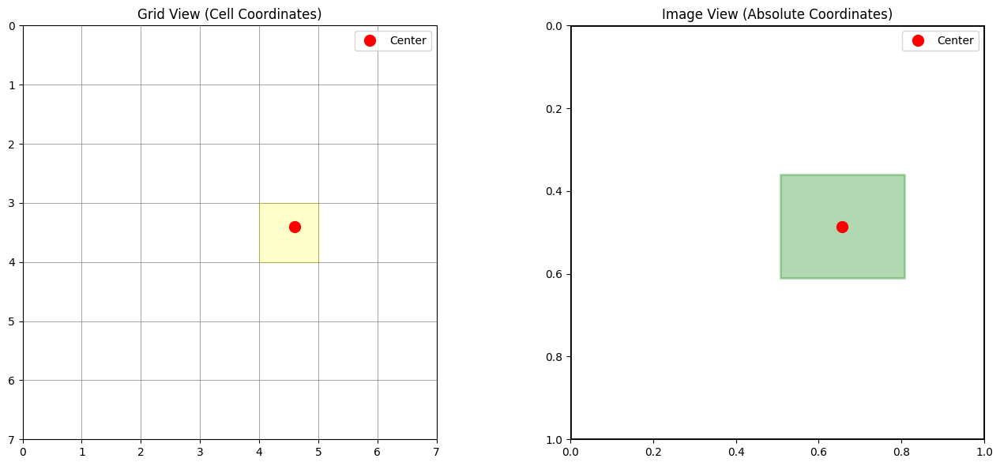

In [8]:
# Demonstrate coordinate encoding with example
S = 7
cell_i, cell_j = 3, 4

# Predicted values (from model)
x_pred, y_pred = 0.6, 0.4
w_pred, h_pred = 0.3, 0.25

# Convert to absolute coordinates
x_abs = (x_pred + cell_j) / S
y_abs = (y_pred + cell_i) / S
w_abs = w_pred
h_abs = h_pred

print("Cell position: ({}, {})".format(cell_i, cell_j))
print("\nPredicted (relative to cell):")
print(f"  x_pred = {x_pred}, y_pred = {y_pred}")
print(f"  w_pred = {w_pred}, h_pred = {h_pred}")
print("\nAbsolute (relative to image):")
print(f"  x_abs = {x_abs:.3f}, y_abs = {y_abs:.3f}")
print(f"  w_abs = {w_abs:.3f}, h_abs = {h_abs:.3f}")

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Left: Show grid with highlighted cell
for i in range(S + 1):
    ax1.axhline(i, color='gray', linewidth=0.5)
    ax1.axvline(i, color='gray', linewidth=0.5)

# Highlight the cell
rect = patches.Rectangle((cell_j, cell_i), 1, 1, 
                          linewidth=2, edgecolor='yellow', facecolor='yellow', alpha=0.2)
ax1.add_patch(rect)

# Show center point
center_in_cell_x = cell_j + x_pred
center_in_cell_y = cell_i + y_pred
ax1.plot(center_in_cell_x, center_in_cell_y, 'ro', markersize=10, label='Center')

ax1.set_xlim(0, S)
ax1.set_ylim(0, S)
ax1.set_aspect('equal')
ax1.invert_yaxis()
ax1.set_title('Grid View (Cell Coordinates)', fontsize=12)
ax1.legend()

# Right: Show full image coordinates
ax2.add_patch(patches.Rectangle((0, 0), 1, 1, 
                                 linewidth=2, edgecolor='black', facecolor='none'))

# Convert box to corner coordinates for visualization
box_x1 = x_abs - w_abs / 2
box_y1 = y_abs - h_abs / 2

box_rect = patches.Rectangle((box_x1, box_y1), w_abs, h_abs,
                              linewidth=2, edgecolor='green', facecolor='green', alpha=0.3)
ax2.add_patch(box_rect)
ax2.plot(x_abs, y_abs, 'ro', markersize=10, label='Center')

ax2.set_xlim(0, 1)
ax2.set_ylim(0, 1)
ax2.set_aspect('equal')
ax2.invert_yaxis()
ax2.set_title('Image View (Absolute Coordinates)', fontsize=12)
ax2.legend()

plt.tight_layout()
plt.show()

**Mathematical Formulation:**

Given a cell at grid position $(i, j)$ and predicted values $(x_{pred}, y_{pred}, w_{pred}, h_{pred})$:

$$
\begin{align}
x_{absolute} &= \frac{x_{pred} + j}{S} \\
y_{absolute} &= \frac{y_{pred} + i}{S} \\
w_{absolute} &= w_{pred} \\
h_{absolute} &= h_{pred}
\end{align}
$$

Where:
- $(x_{pred}, y_{pred}) \in [0, 1]$ are offsets within the cell
- $(w_{pred}, h_{pred})$ are fractions of total image dimensions
- $S = 7$ is the grid size

In [9]:
%%manim -qm -v WARNING YoloCoordinatesInline

class YoloCoordinatesInline(Scene):
    """Animates how (x, y, w, h) are predicted."""
    def construct(self):
        S = 7
        IMG_WIDTH = 4.0

        # --- 1. Setup Context ---
        title = Text("YOLOv1: Coordinate Prediction").scale(0.8).to_edge(UP, buff=0.3)
        self.play(Write(title))

        # Show the full image/grid (small, for context)
        image_rect = Rectangle(width=IMG_WIDTH, height=IMG_WIDTH, color=GRAY_B).shift(LEFT * 4.5 + DOWN * 0.5)

        grid = VGroup(
            *[Square(side_length=IMG_WIDTH / S, stroke_width=1, stroke_color=GRAY_C)
              for _ in range(S * S)]
        ).arrange_in_grid(S, S, buff=0).move_to(image_rect)

        image_label = Text("Full Image Context", color=GRAY).scale(0.5).next_to(image_rect, DOWN, buff=0.2)
        self.add(image_rect, grid, image_label)

        # Show a "zoomed-in" cell
        zoomed_cell = Square(side_length=4.0, color=WHITE, stroke_width=3).shift(RIGHT * 2.5 + UP * 0.5)
        cell_label = Text("Zoomed-in Cell (i, j)").scale(0.7).next_to(zoomed_cell, UP, buff=0.2)
        self.play(Create(zoomed_cell), Write(cell_label))

        # --- 2. Define Predicted (x, y) ---
        x_pred_val = 0.7
        y_pred_val = 0.4

        cell_origin_ul = zoomed_cell.get_corner(UL)
        obj_center_abs = (
            cell_origin_ul + RIGHT * x_pred_val * zoomed_cell.width + DOWN * y_pred_val * zoomed_cell.height
        )

        obj_dot = Dot(obj_center_abs, color=RED, radius=0.08)

        # --- 3. Animate (x, y) relative to CELL ---
        x_line = Line(cell_origin_ul, cell_origin_ul + RIGHT * x_pred_val * zoomed_cell.width,
                      color=BLUE, stroke_width=5)
        x_brace = Brace(x_line, direction=DOWN, buff=0.2)
        x_label = Text(f"x = {x_pred_val}").scale(0.6).next_to(x_brace, DOWN)

        y_line = Line(x_line.get_end(), obj_dot, color=ORANGE, stroke_width=5)
        y_brace = Brace(y_line, direction=RIGHT, buff=0.2)
        y_label = Text(f"y = {y_pred_val}").scale(0.6).next_to(y_brace, RIGHT)

        xy_text = Text("(x, y) are offsets\nrelative to the cell", t2c={"(x, y)": YELLOW}).scale(0.6)
        xy_text.shift(DOWN * 3.2 + RIGHT * 2.5)

        self.play(FadeIn(obj_dot), Write(xy_text))
        self.play(Create(x_line), FadeIn(x_brace), FadeIn(x_label), run_time=1.5)
        self.play(Create(y_line), FadeIn(y_brace), FadeIn(y_label), run_time=1.5)
        self.wait(1)

        # --- 4. Define Predicted (w, h) ---
        w_pred_val = 0.3
        h_pred_val = 0.4

        # Show the predicted box
        pred_box = Rectangle(
            width=w_pred_val * IMG_WIDTH, height=h_pred_val * IMG_WIDTH,
            color=GREEN, stroke_width=3
        ).move_to(obj_dot)

        self.play(Create(pred_box))

        # Show braces on the IMAGE
        w_brace_img = Brace(image_rect, direction=DOWN, buff=0.1, color=GRAY)
        w_brace_img_label = Text("Image Width = 1.0", color=GRAY).scale(0.5).next_to(w_brace_img, DOWN)

        # Show braces on the BOX
        w_brace_box = Brace(pred_box, direction=DOWN, buff=0.1, color=GREEN)
        w_brace_box_label = Text(f"w = {w_pred_val}").scale(0.6).next_to(w_brace_box, DOWN)

        h_brace_box = Brace(pred_box, direction=LEFT, buff=0.1, color=GREEN)
        h_brace_box_label = Text(f"h = {h_pred_val}").scale(0.6).next_to(h_brace_box, LEFT)

        wh_text = Text("(w, h) are percentages\nof the TOTAL IMAGE", t2c={"(w, h)": YELLOW}).scale(0.6)
        wh_text.shift(DOWN * 3.2 + LEFT * 2.5)

        self.play(FadeIn(wh_text))
        self.play(FadeIn(w_brace_img), FadeIn(w_brace_img_label))
        self.play(TransformFromCopy(w_brace_img, w_brace_box), TransformFromCopy(w_brace_img_label, w_brace_box_label))
        self.play(FadeIn(h_brace_box), FadeIn(h_brace_box_label))
        self.wait(2)

Manim Community v0.19.0

### Coordinate Encoding

YOLO uses a clever encoding scheme for bounding box coordinates:

In [10]:
%%manim -qm -v WARNING PredictionTensorInline

class PredictionTensorInline(Scene):
    """Shows what each responsible cell predicts."""
    def construct(self):
        B = 2  # Number of bounding boxes
        C = 20  # Number of classes
        TENSOR_LENGTH = B * 5 + C  # 30

        # Title
        title = Text("YOLOv1: The Prediction Tensor").scale(0.8).to_edge(UP, buff=0.3)
        self.play(Write(title))

        # Show a highlighted cell
        cell = Square(side_length=2.0, color=YELLOW, fill_opacity=0.3).shift(LEFT * 4 + UP * 0.5)
        cell_label = Text("Responsible Cell").scale(0.6).next_to(cell, UP, buff=0.2)
        self.play(Create(cell), Write(cell_label))
        self.wait(0.5)

        # Pull out the prediction vector
        vector_start = cell.get_right()
        vector_end = vector_start + RIGHT * 6

        tensor_rect = Rectangle(
            width=6.0, height=0.4, color=WHITE, fill_opacity=0.2
        ).move_to((vector_start + vector_end) / 2 + UP * 0.5)

        arrow = Arrow(vector_start, tensor_rect.get_left(), buff=0.1, color=WHITE)
        tensor_label = Text(f"Prediction Tensor (length {TENSOR_LENGTH})").scale(0.5)
        tensor_label.next_to(tensor_rect, UP, buff=0.2)

        self.play(Create(arrow), Create(tensor_rect), Write(tensor_label))
        self.wait(1)

        # Split into three chunks
        box1_width = (5 / TENSOR_LENGTH) * 6.0
        box2_width = (5 / TENSOR_LENGTH) * 6.0
        class_width = (C / TENSOR_LENGTH) * 6.0

        chunk1 = Rectangle(
            width=box1_width, height=0.4, color=BLUE, fill_opacity=0.5
        ).next_to(tensor_rect.get_left(), RIGHT, buff=0)
        chunk1.align_to(tensor_rect, DOWN)

        chunk2 = Rectangle(
            width=box2_width, height=0.4, color=GREEN, fill_opacity=0.5
        ).next_to(chunk1, RIGHT, buff=0)
        chunk2.align_to(tensor_rect, DOWN)

        chunk3 = Rectangle(
            width=class_width, height=0.4, color=RED, fill_opacity=0.5
        ).next_to(chunk2, RIGHT, buff=0)
        chunk3.align_to(tensor_rect, DOWN)

        chunk1_label = Text("Box 1\n(x,y,w,h,c)", color=BLUE).scale(0.4)
        chunk1_label.next_to(chunk1, DOWN, buff=0.4)

        chunk2_label = Text("Box 2\n(x,y,w,h,c)", color=GREEN).scale(0.4)
        chunk2_label.next_to(chunk2, DOWN, buff=0.4)

        chunk3_label = Text("Class Probs\n(20 values)", color=RED).scale(0.4)
        chunk3_label.next_to(chunk3, DOWN, buff=0.4)

        self.play(FadeOut(tensor_rect), Create(chunk1), Create(chunk2), Create(chunk3))
        self.play(Write(chunk1_label), Write(chunk2_label), Write(chunk3_label))
        self.wait(1)

        explanation = Text(
            f"Each cell predicts {B} boxes and one set of class probabilities",
            t2c={f"{B}": YELLOW, "class probabilities": RED},
        ).scale(0.6)
        explanation.to_edge(DOWN)
        self.play(Write(explanation))
        self.wait(2)

Manim Community v0.19.0

---
## 4. Prediction Tensor Explained

### The 30-Dimensional Output Vector

Each of the $7 \times 7 = 49$ grid cells outputs a **30-dimensional vector**:

$$
\text{Prediction Vector} = [\underbrace{x_1, y_1, w_1, h_1, c_1}_{\text{Box 1 (5)}}, \underbrace{x_2, y_2, w_2, h_2, c_2}_{\text{Box 2 (5)}}, \underbrace{p_1, p_2, \ldots, p_{20}}_{\text{Class Probabilities (20)}}]
$$

**Components:**
- **Bounding Boxes (B=2):** Each box has 5 values
  - $(x, y)$: Center coordinates relative to cell
  - $(w, h)$: Width and height relative to image
  - $c$: Confidence score (objectness)
- **Class Probabilities (C=20):** One probability per class

**Total:** $2 \times 5 + 20 = 30$ values per cell

### Architecture Breakdown

The network can be divided into two main parts:

1. **Feature Extraction (Backbone):** 
   - 24 convolutional layers
   - Extracts semantic features from the image
   - Reduces spatial dimensions: $448 \times 448 \rightarrow 7 \times 7$
   - Increases depth: $3 \rightarrow 1024$ channels

2. **Detection Head:**
   - 2 fully connected layers
   - Converts features to predictions
   - Output: $7 \times 7 \times 30$ predictions

Model loaded successfully!
Total parameters: 282,245,630
Trainable parameters: 282,245,630


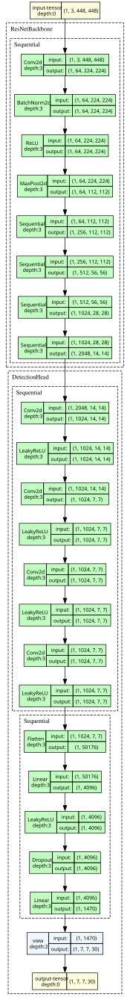

In [11]:
# Visualize the network architecture
from torchview import draw_graph

# Load model
model = load_model(
    checkpoint_path="../checkpoints/yolo_best_v3.pth",
    device=DEVICE,
)

# Create sample input
sample_input = torch.randn(1, 3, 448, 448)

# Visualize architecture
model_graph = draw_graph(
    model,
    input_size=sample_input.shape,
    expand_nested=True,
    graph_name="YOLOv1 Architecture",
)

print("Model loaded successfully!")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

model_graph.visual_graph

In [12]:
# Initialize inference pipeline
register_hooks(model)
inference = YOLOInference(model, device=DEVICE)

print("✓ Inference pipeline initialized")
print(f"✓ Hooks registered for {len(activations)} layers")

✓ Inference pipeline initialized
✓ Hooks registered for 0 layers


---
## 6. Inference Pipeline

### From Image to Detections

The inference process consists of several steps:

1. **Preprocessing:** Resize image to $448 \times 448$
2. **Forward Pass:** Run through network
3. **Decode Predictions:** Convert tensor to bounding boxes
4. **Confidence Filtering:** Remove low-confidence boxes
5. **Non-Maximum Suppression:** Remove duplicate detections

Original image size: (353, 500)
Preprocessed tensor shape: torch.Size([1, 3, 448, 448])
Tensor range: [-2.118, 2.640]


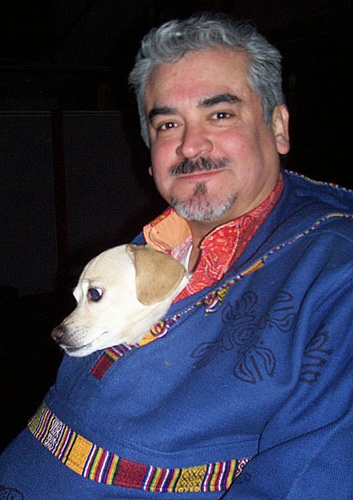

In [13]:
# Load a sample image
image_path = "sample.jpg"
image = inference.load_image(image_path)
image_tensor = inference.preprocess_image(image)

print(f"Original image size: {image.size}")
print(f"Preprocessed tensor shape: {image_tensor.shape}")
print(f"Tensor range: [{image_tensor.min():.3f}, {image_tensor.max():.3f}]")

# Display original image
image

### Forward Pass Through Network

Let's visualize what happens inside the network during inference.

In [14]:
# Run inference with very low threshold to see all predictions
detections = inference.predict(
    image_path=image_path, 
    conf_threshold=0.01,  # Very low threshold
    nms_threshold=1.0     # No NMS yet
)

print(f"Total detections (before filtering): {len(detections)}")
print("\nTop 5 detections:")
for i, det in enumerate(sorted(detections, key=lambda x: x.confidence, reverse=True)[:5]):
    print(f"  {i+1}. {det.class_name:15s} confidence={det.confidence:.3f} at {det.bbox}")

Total detections (before filtering): 17

Top 5 detections:
  1. class_14        confidence=0.436 at (0.13, 0.05, 0.92, 0.97)
  2. class_14        confidence=0.170 at (0.14, 0.13, 0.84, 0.85)
  3. class_14        confidence=0.159 at (0.33, 0.09, 0.90, 0.93)
  4. class_14        confidence=0.089 at (0.53, 0.10, 0.96, 0.92)
  5. class_1         confidence=0.047 at (0.09, 0.52, 0.93, 0.97)


### Step 3: Run Inference (with minimal filtering)

In [15]:
# visualize feature maps
display(visualize_activations(activations))

[11/16/25 14:03:31] INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>       ]8;id=307419;file:///Users/mattias/programmering/kthais/yolo-v1/.venv/lib/python3.13/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=869693;file:///Users/mattias/programmering/kthais/yolo-v1/.venv/lib/python3.13/site-packages/matplotlib/animation.py#1076\1076]8;;\

### Network Activations Visualization

Watch how features evolve through the network layers:

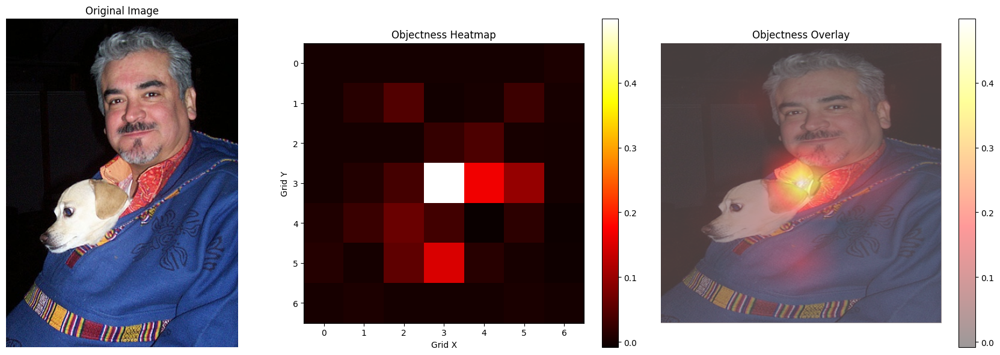

In [16]:
# Visualize objectness grid (confidence heatmap)
from yolo.utils.visualization import visualize_objectness_grid

with torch.no_grad():
    predictions = inference.model(image_tensor)

_ = visualize_objectness_grid(
    image=image,
    predictions=predictions,
)

### Objectness Grid Visualization

Each grid cell predicts confidence scores. Let's visualize which cells think they contain objects:

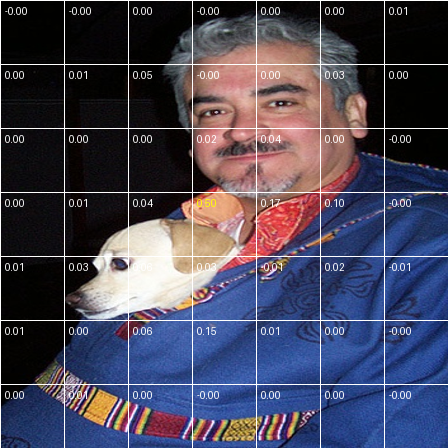

In [17]:
# Draw objectness grid overlay on original image
from yolo.utils.visualization import draw_objectness_grid_on_image

img_with_grid = draw_objectness_grid_on_image(
    image=image,
    predictions=predictions,
)
display(img_with_grid)

Showing all 17 detections with confidence ≥ 0.01


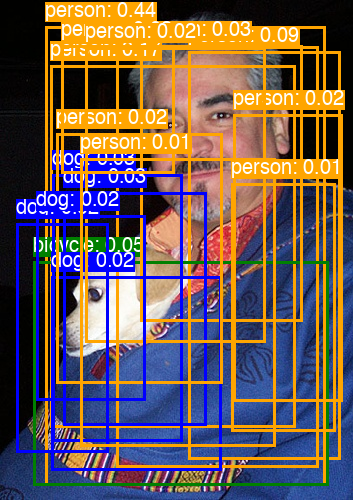

In [18]:
# Show raw predictions (very low confidence threshold)
from yolo.utils.visualization import VOC_CLASSES, draw_detections

img_with_all_boxes = draw_detections(
    image=image, 
    detections=detections, 
    class_names=VOC_CLASSES, 
    conf_threshold=0.01
)

print(f"Showing all {len([d for d in detections if d.confidence >= 0.01])} detections with confidence ≥ 0.01")
img_with_all_boxes

---
## 7. Confidence Filtering

### Computing Final Confidence Scores

For each detected box, YOLO computes a **class-specific confidence score**:

$$
\text{score}_{class} = Pr(\text{Class}_i | \text{Object}) \times Pr(\text{Object}) \times \text{IoU}_{pred}^{truth}
$$

Simplified during inference:

$$
\text{score}_{class} = Pr(\text{Class}_i | \text{Object}) \times c
$$

Where:
- $Pr(\text{Class}_i | \text{Object})$ = conditional class probability
- $c$ = confidence score (objectness)

**Filtering:** Keep only boxes with $\text{score}_{class} \geq \text{threshold}$

After confidence filtering (threshold=0.2):
  Remaining detections: 1


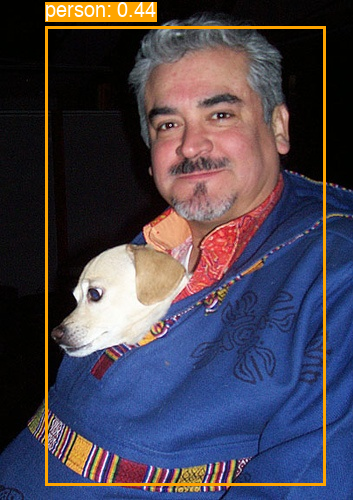

In [19]:
# Filter by confidence threshold
CONF_THRESHOLD = 0.2  # Adjust this value

filtered_detections = [d for d in detections if d.confidence >= CONF_THRESHOLD]

img_filtered = draw_detections(
    image=image, 
    detections=detections, 
    class_names=VOC_CLASSES, 
    conf_threshold=CONF_THRESHOLD
)

print(f"After confidence filtering (threshold={CONF_THRESHOLD}):")
print(f"  Remaining detections: {len(filtered_detections)}")
img_filtered

### Interactive Confidence Threshold

Try different confidence thresholds to see how it affects detections:

Before NMS: 17 detections
After NMS (threshold=0.4): 8 detections

Remaining detections:
  1. class_14        confidence=0.436
  2. class_1         confidence=0.047
  3. class_11        confidence=0.029
  4. class_14        confidence=0.029
  5. class_14        confidence=0.023
  6. class_14        confidence=0.022
  7. class_14        confidence=0.020
  8. class_11        confidence=0.016


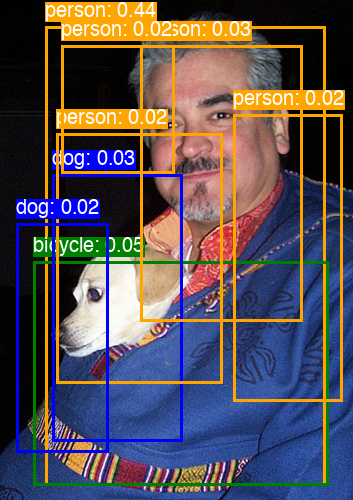

In [20]:
# Apply NMS to remove duplicate detections
NMS_THRESHOLD = 0.4  # Typical value: 0.3-0.5

nms_detections = inference.non_max_suppression(
    detections=detections, 
    nms_threshold=NMS_THRESHOLD
)

img_with_nms = draw_detections(
    image=image, 
    detections=nms_detections, 
    class_names=VOC_CLASSES, 
    conf_threshold=0.01
)

print(f"Before NMS: {len(detections)} detections")
print(f"After NMS (threshold={NMS_THRESHOLD}): {len(nms_detections)} detections")
print("\nRemaining detections:")
for i, det in enumerate(sorted(nms_detections, key=lambda x: x.confidence, reverse=True)):
    print(f"  {i+1}. {det.class_name:15s} confidence={det.confidence:.3f}")

img_with_nms

In [21]:
%%manim -qm -v WARNING NonMaximalSuppressionInline

class NonMaximalSuppressionInline(Scene):
    """Demonstrates NMS to clean up overlapping boxes."""
    def construct(self):
        # Title
        title = Text("YOLOv1: Non-Maximum Suppression (NMS)").scale(0.75).to_edge(UP, buff=0.3)
        self.play(Write(title))

        # Show an image area with overlapping boxes
        image_area = Rectangle(width=5.5, height=3.5, color=GRAY_B).shift(LEFT * 2.5 + DOWN * 0.3)
        self.play(Create(image_area))

        # Three overlapping boxes for "dog"
        box_a = Rectangle(width=2.0, height=1.5, color=GREEN, stroke_width=4)
        box_a.move_to(image_area.get_center() + UP * 0.2)
        label_a = Text("A: 0.85", color=GREEN).scale(0.5).next_to(box_a, UP, buff=0.1)

        box_b = Rectangle(width=2.1, height=1.6, color=BLUE, stroke_width=4)
        box_b.move_to(image_area.get_center() + RIGHT * 0.3)
        label_b = Text("B: 0.75", color=BLUE).scale(0.5).next_to(box_b, UP, buff=0.1)

        box_c = Rectangle(width=1.8, height=1.4, color=ORANGE, stroke_width=4)
        box_c.move_to(image_area.get_center() + LEFT * 0.2 + DOWN * 0.1)
        label_c = Text("C: 0.60", color=ORANGE).scale(0.5).next_to(box_c, UP, buff=0.1)

        self.play(Create(box_a), Write(label_a), Create(box_b), Write(label_b), Create(box_c), Write(label_c))
        self.wait(1)

        # Show NMS process
        process_title = Text("NMS Process:").scale(0.55).shift(RIGHT * 4 + UP * 2.5)
        self.play(Write(process_title))

        # Step 1: Sort by confidence
        step1 = Text("1. Keep box A (highest)", color=GREEN).scale(0.45)
        step1.next_to(process_title, DOWN, aligned_edge=LEFT, buff=0.25)
        self.play(Write(step1), Flash(box_a, color=GREEN))
        self.wait(1)

        # Step 2: Check IoU with B
        step2 = Text("2. IoU(A,B) = 0.9 > 0.5", color=BLUE).scale(0.45)
        step2.next_to(step1, DOWN, aligned_edge=LEFT, buff=0.25)
        self.play(Write(step2))
        self.wait(0.5)

        step2b = Text("   → Suppress B", color=GRAY).scale(0.45)
        step2b.next_to(step2, DOWN, aligned_edge=LEFT, buff=0.15)
        self.play(
            Write(step2b),
            box_b.animate.set_stroke(color=GRAY, opacity=0.3),
            label_b.animate.set_color(GRAY).set_opacity(0.3)
        )
        self.wait(1)

        # Step 3: Check IoU with C
        step3 = Text("3. IoU(A,C) = 0.8 > 0.5", color=ORANGE).scale(0.45)
        step3.next_to(step2b, DOWN, aligned_edge=LEFT, buff=0.25)
        self.play(Write(step3))
        self.wait(0.5)

        step3b = Text("   → Suppress C", color=GRAY).scale(0.45)
        step3b.next_to(step3, DOWN, aligned_edge=LEFT, buff=0.15)
        self.play(
            Write(step3b),
            box_c.animate.set_stroke(color=GRAY, opacity=0.3),
            label_c.animate.set_color(GRAY).set_opacity(0.3)
        )
        self.wait(1)

        # Final result
        result = Text("Final: Keep only Box A!", color=GREEN).scale(0.5)
        result.next_to(step3b, DOWN, buff=0.4)
        self.play(Write(result), Flash(box_a, color=GREEN, flash_radius=1.2))
        self.wait(2)

Manim Community v0.19.0

### NMS Algorithm

**Input:** List of detections with confidence scores  
**Output:** Filtered list with no overlapping boxes

**Algorithm:**
1. Sort all boxes by confidence score (highest first)
2. Take the box with highest confidence
3. Remove all boxes with IoU > threshold with this box
4. Repeat for remaining boxes

**IoU (Intersection over Union):**

$$
\text{IoU} = \frac{\text{Area of Intersection}}{\text{Area of Union}}
$$

In [22]:
%%manim -qm -v WARNING LargeObjectMultipleCellsInline

class LargeObjectMultipleCellsInline(Scene):
    """Clarifies that large objects are NOT detected by combining cells."""
    def construct(self):
        S = 7
        IMG_SIDE_LENGTH = 6.0

        # Title
        title = Text("Handling Large Objects").scale(0.8).to_edge(UP, buff=0.3)
        self.play(Write(title))

        # Create the 'Image' and Grid
        image_rect = Square(side_length=IMG_SIDE_LENGTH, color=WHITE, stroke_width=2).shift(LEFT * 2)
        self.play(Create(image_rect))

        grid = VGroup(
            *[Square(side_length=IMG_SIDE_LENGTH / S, stroke_width=1, stroke_color=GRAY)
              for _ in range(S * S)]
        ).arrange_in_grid(S, S, buff=0).move_to(image_rect)
        self.play(Create(grid))

        # Add a LARGE Ground Truth Object (a "bus")
        gt_center_rel = (0.4, 0.5)
        gt_dims_rel = (0.5, 0.4)

        img_origin_ul = image_rect.get_corner(UL)
        gt_center_abs = (
            img_origin_ul + RIGHT * gt_center_rel[0] * IMG_SIDE_LENGTH + DOWN * gt_center_rel[1] * IMG_SIDE_LENGTH
        )

        gt_box = Rectangle(
            width=gt_dims_rel[0] * IMG_SIDE_LENGTH,
            height=gt_dims_rel[1] * IMG_SIDE_LENGTH,
            color=PURPLE, stroke_width=3
        ).move_to(gt_center_abs)
        gt_label = Text("Bus").scale(0.6).next_to(gt_box, UP, buff=0.1)

        self.play(Create(gt_box), Write(gt_label))
        self.wait(1)

        # Find overlapping cells
        overlapping_cells = VGroup()
        for cell in grid:
            cell_center = cell.get_center()
            if (abs(cell_center[0] - gt_center_abs[0]) < gt_box.width / 2 and
                abs(cell_center[1] - gt_center_abs[1]) < gt_box.height / 2):
                overlapping_cells.add(cell.copy().set(fill_color=PINK, fill_opacity=0.5))

        self.play(FadeIn(overlapping_cells))

        question = Text("Which cell is responsible?\nAll of them?", t2c={"All of them?": YELLOW})
        question.scale(0.6).shift(RIGHT * 4)
        self.play(Write(question))
        self.wait(2)

        # The Answer
        answer = Text("No! Only the cell with\nthe object's CENTER.", t2c={"CENTER": YELLOW})
        answer.scale(0.6).next_to(question, DOWN, buff=0.5, aligned_edge=LEFT)

        # Find the responsible cell
        cell_i = int(gt_center_rel[1] * S)
        cell_j = int(gt_center_rel[0] * S)
        responsible_cell = grid[cell_i * S + cell_j].copy().set(fill_color=YELLOW, fill_opacity=0.8)

        gt_center_dot = Dot(gt_center_abs, color=YELLOW, radius=0.08)

        self.play(FadeOut(overlapping_cells), FadeOut(question))
        self.play(FadeIn(responsible_cell), Create(gt_center_dot), Write(answer))
        self.play(Flash(gt_center_dot, color=YELLOW, flash_radius=0.5, line_length=0.3))
        self.wait(2)

        # What about other cells?
        extra_text = Text("...but other cells might\n*still try* to predict it.", color=GRAY)
        extra_text.scale(0.6).next_to(answer, DOWN, buff=0.5, aligned_edge=LEFT)
        self.play(Write(extra_text))

        # Show multiple predictions
        self.play(FadeOut(gt_box, gt_label, responsible_cell))

        box_good = gt_box.copy().set_color(GREEN)
        label_good = Text("Conf: 0.9", color=GREEN).scale(0.5).next_to(box_good, DOWN, buff=0.2)

        box_bad_1 = Rectangle(
            width=(gt_dims_rel[0] * 0.8) * IMG_SIDE_LENGTH,
            height=(gt_dims_rel[1] * 1.1) * IMG_SIDE_LENGTH,
            color=ORANGE, stroke_width=2
        ).move_to(gt_center_abs + LEFT * 0.3 + UP * 0.2)
        label_bad_1 = Text("Conf: 0.6", color=ORANGE).scale(0.5).next_to(box_bad_1, LEFT, buff=0.2)

        box_bad_2 = Rectangle(
            width=(gt_dims_rel[0] * 1.2) * IMG_SIDE_LENGTH,
            height=(gt_dims_rel[1] * 0.7) * IMG_SIDE_LENGTH,
            color=RED, stroke_width=2
        ).move_to(gt_center_abs + RIGHT * 0.2 + DOWN * 0.1)
        label_bad_2 = Text("Conf: 0.4", color=RED).scale(0.5).next_to(box_bad_2, DOWN, buff=0.2)

        self.play(
            Create(box_good), Write(label_good),
            Create(box_bad_1), Write(label_bad_1),
            Create(box_bad_2), Write(label_bad_2)
        )
        self.wait(2)

        # Conclusion
        self.play(FadeOut(answer, extra_text))

        conclusion1 = Text("This creates multiple, overlapping\npredictions for the same object...")
        conclusion1.scale(0.6).shift(RIGHT * 4)
        self.play(Write(conclusion1))
        self.wait(2)

        conclusion2 = Text(
            "...which are all cleaned up by\nNon-Maximum Suppression (NMS)!",
            t2c={"NMS": YELLOW}
        )
        conclusion2.scale(0.6).next_to(conclusion1, DOWN, buff=0.5, aligned_edge=LEFT)

        self.play(Write(conclusion2))
        self.play(
            FadeToColor(box_bad_1, GRAY), FadeToColor(label_bad_1, GRAY),
            FadeToColor(box_bad_2, GRAY), FadeToColor(label_bad_2, GRAY)
        )
        self.play(Wiggle(box_good))
        self.wait(2)

Manim Community v0.19.0

---
## 8. Non-Maximum Suppression (NMS)

### The Problem: Multiple Detections for Same Object

Even after confidence filtering, we often get multiple overlapping boxes for the same object. This happens because:

1. **Both bounding boxes** in a cell might detect the same object
2. **Neighboring cells** might also detect objects that span multiple cells
3. **Large objects** especially trigger multiple detections

FINAL DETECTIONS
Confidence threshold: 0.2
NMS threshold: 0.4
Total detections: 1

Detected objects:
  1. class_14        0.436 at [0.53, 0.51, 0.79, 0.92]


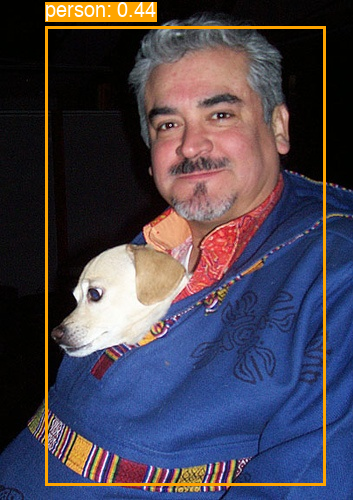

In [23]:
# Final result: Apply both confidence threshold and NMS
FINAL_CONF_THRESHOLD = 0.2
FINAL_NMS_THRESHOLD = 0.4

final_detections = inference.predict(
    image_path=image_path,
    conf_threshold=FINAL_CONF_THRESHOLD,
    nms_threshold=FINAL_NMS_THRESHOLD
)

img_final = draw_detections(
    image=image,
    detections=final_detections,
    class_names=VOC_CLASSES,
    conf_threshold=FINAL_CONF_THRESHOLD,
)

print("="*60)
print("FINAL DETECTIONS")
print("="*60)
print(f"Confidence threshold: {FINAL_CONF_THRESHOLD}")
print(f"NMS threshold: {FINAL_NMS_THRESHOLD}")
print(f"Total detections: {len(final_detections)}")
print("\nDetected objects:")
for i, det in enumerate(final_detections):
    bbox = det.bbox
    print(f"  {i+1}. {det.class_name:15s} {det.confidence:.3f} at [{bbox.x:.2f}, {bbox.y:.2f}, {bbox.width:.2f}, {bbox.height:.2f}]")

img_final

### Final Result: Clean Detections

Combine both confidence filtering and NMS:

---
## 9. Complete Example: Multiple Images

Let's test the full pipeline on different types of images:


Image: sample.jpg
Detections: 1
  1. class_14        0.436


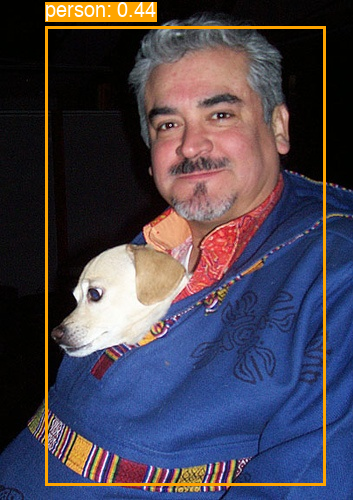

In [ ]:
# Function to process and display any image
def process_and_display(image_path, conf_threshold=0.2, nms_threshold=0.4):
    """Process an image through the full YOLO pipeline"""
    # Load and preprocess
    img = inference.load_image(image_path)
    
    # Run inference
    dets = inference.predict(
        image_path=image_path,
        conf_threshold=conf_threshold,
        nms_threshold=nms_threshold,
        class_names=VOC_CLASSES,
    )
    
    # Draw detections
    img_with_boxes = draw_detections(
        image=img,
        detections=dets,
        class_names=VOC_CLASSES,
        conf_threshold=conf_threshold
    )
    
    # Print results
    print(f"\nImage: {image_path}")
    print(f"Detections: {len(dets)}")
    for i, det in enumerate(dets):
        print(f"  {i+1}. {det.class_name:15s} {det.confidence:.3f}")
    
    return img_with_boxes

# Process the sample image
result = process_and_display("sample.jpg")
display(result)

### Comparison: Before and After Post-Processing

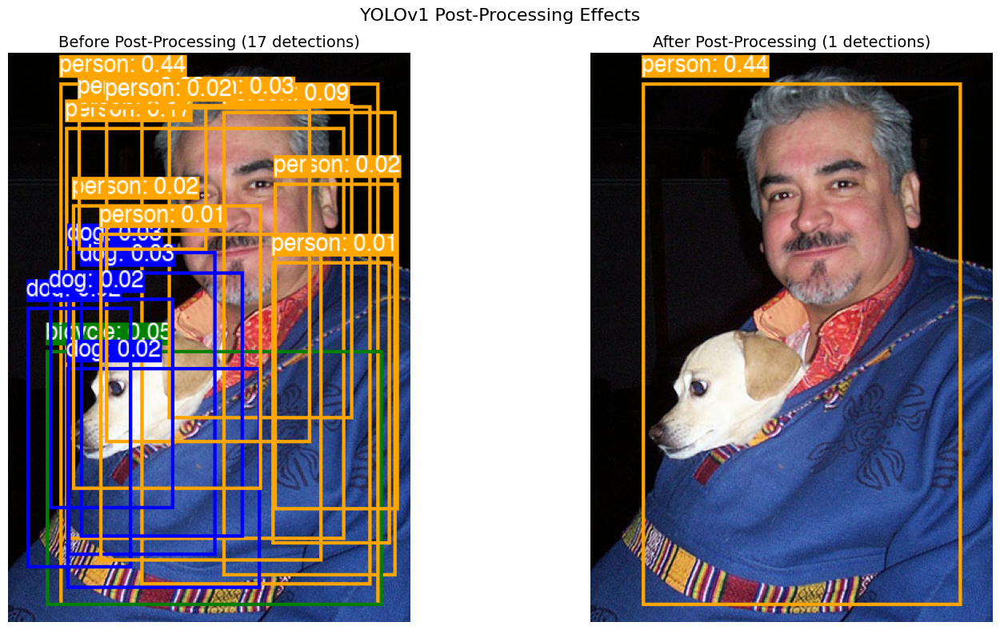

In [25]:
# Side-by-side comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# title
fig.suptitle('YOLOv1 Post-Processing Effects', fontsize=16)

# Before Post-Processing
dets_before = inference.predict(image_path="sample.jpg", conf_threshold=0.01, nms_threshold=1.0)
img_before = draw_detections(image, dets_before, VOC_CLASSES, conf_threshold=0.01)
ax1.imshow(img_before)
ax1.set_title(f'Before Post-Processing ({len(dets_before)} detections)', fontsize=14)
ax1.axis('off')

# After Post-Processing
dets_after = inference.predict(image_path="sample.jpg", conf_threshold=0.1, nms_threshold=0.4)
img_after = draw_detections(image, dets_after, VOC_CLASSES, conf_threshold=0.1)
ax2.imshow(img_after)
ax2.set_title(f'After Post-Processing ({len(dets_after)} detections)', fontsize=14)
ax2.axis('off')

plt.tight_layout()
plt.show()

---
## 10. Results & Metrics

### Model Performance

Let's look at the actual performance of our trained model:

In [26]:
# Load evaluation results
import os

eval_file = "../checkpoints/evaluation_results.txt"
if os.path.exists(eval_file):
    print("="*60)
    print("MODEL EVALUATION RESULTS")
    print("="*60)
    with open(eval_file, 'r') as f:
        print(f.read())
else:
    print("Evaluation results not found. Run evaluation script first.")

MODEL EVALUATION RESULTS
YOLO v1 Evaluation Results
Checkpoint: /Users/mattias/programmering/kthais/yolo-v1/checkpoints/yolo_best.pth
Dataset: VOC2007 test
Number of images: 4952

mAP50:95: 0.2120
mAP@0.5: 0.4387
mAP@0.75: 0.1433
Precision: 0.1747
Recall: 0.5227

Size-Based Metrics:
----------------------------------------------------------------------
  Small objects  (area < 32x32):
    mAP50:95: 0.0818  (n=875)
    mAP@0.5:  0.0818
    mAP@0.75: 0.0818
  Medium objects (32x32 <= area < 96x96):
    mAP50:95: 0.0925  (n=4126)
    mAP@0.5:  0.0994
    mAP@0.75: 0.0909
  Large objects  (area >= 96x96):
    mAP50:95: 0.2619  (n=8322)
    mAP@0.5:  0.5639
    mAP@0.75: 0.1731

Per-class Average Precision:
----------------------------------------------------------------------
Class            AP50:95     AP50     AP75
----------------------------------------------------------------------
cat               0.3612   0.6954   0.2954
dog               0.3097   0.6783   0.1943
train            

### PASCAL VOC Classes

The model is trained on **20 object classes** from PASCAL VOC dataset:

In [27]:
# Display all VOC classes
print("PASCAL VOC 20 Classes:")
print("="*60)

categories = {
    "Vehicles": ["aeroplane", "bicycle", "boat", "bus", "car", "motorbike", "train"],
    "Animals": ["bird", "cat", "cow", "dog", "horse", "sheep"],
    "Indoor": ["bottle", "chair", "diningtable", "pottedplant", "sofa", "tvmonitor"],
    "Person": ["person"]
}

for category, classes in categories.items():
    print(f"\n{category}:")
    for cls in classes:
        idx = VOC_CLASSES.index(cls)
        print(f"  {idx:2d}. {cls}")

print(f"\nTotal: {len(VOC_CLASSES)} classes")

PASCAL VOC 20 Classes:

Vehicles:
   0. aeroplane
   1. bicycle
   3. boat
   5. bus
   6. car
  13. motorbike
  18. train

Animals:
   2. bird
   7. cat
   9. cow
  11. dog
  12. horse
  16. sheep

Indoor:
   4. bottle
   8. chair
  10. diningtable
  15. pottedplant
  17. sofa
  19. tvmonitor

Person:
  14. person

Total: 20 classes


### Performance Metrics

**Mean Average Precision (mAP):**
- Measures detection quality across all classes
- Combines precision and recall
- IoU threshold typically 0.5 for PASCAL VOC

**Original YOLO Paper Results:**
- **mAP:** 63.4% on PASCAL VOC 2007
- **Speed:** 45 FPS (frames per second)
- **Real-time:** Yes! (~22ms per image)

**Trade-offs:**
- Faster than all two-stage detectors (R-CNN family)
- Slightly lower accuracy than Faster R-CNN (73.2% mAP)
- Struggles with small objects and objects in groups

---
## 11. Limitations & Future Work

### Known Limitations of YOLOv1

1. **Spatial Constraints**
   - Fixed grid size (7×7) limits number of predictions
   - Each cell can only detect B=2 objects
   - Problem: Dense objects or objects in groups

2. **Small Objects**
   - Coarse features at 7×7 resolution
   - Struggles with small objects (e.g., flocks of birds)

3. **Unusual Aspect Ratios**
   - Model learns from training data aspect ratios
   - Poor generalization to unusual shapes

4. **Localization Errors**
   - Treats errors in small boxes same as large boxes
   - Square root helps but not perfect

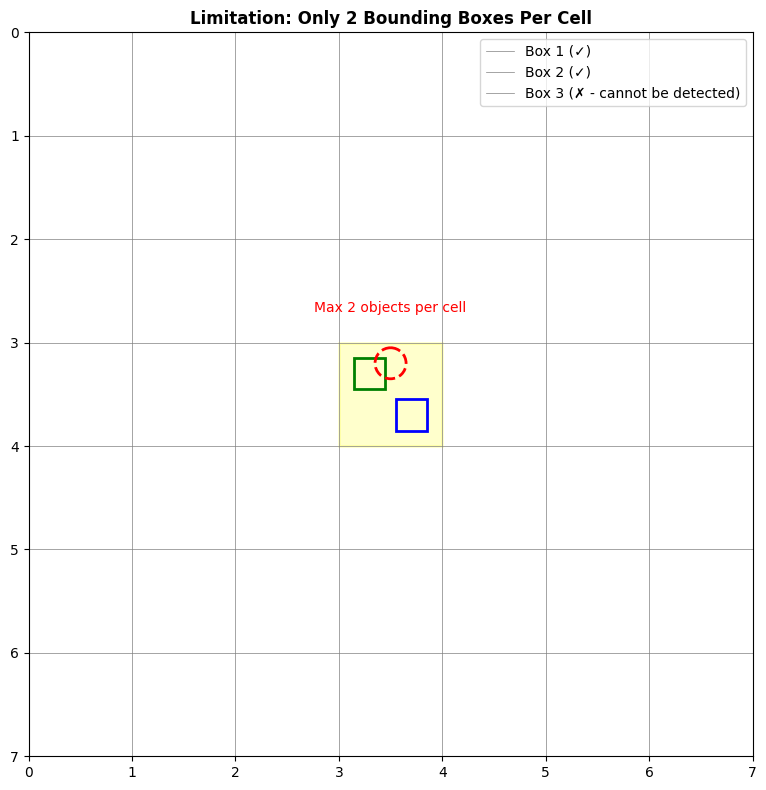

If 3+ objects have centers in the same cell, some will be missed!


In [28]:
# Illustrate spatial constraints
fig, ax = plt.subplots(figsize=(8, 8))

# Draw 7x7 grid
S = 7
for i in range(S + 1):
    ax.axhline(i, color='gray', linewidth=0.5)
    ax.axvline(i, color='gray', linewidth=0.5)

# Show a cell with 2 boxes
cell_i, cell_j = 3, 3
rect = patches.Rectangle((cell_j, cell_i), 1, 1, 
                          linewidth=2, edgecolor='yellow', facecolor='yellow', alpha=0.2)
ax.add_patch(rect)

# Draw 2 boxes in the cell
box1 = patches.Rectangle((cell_j + 0.15, cell_i + 0.15), 0.3, 0.3,
                          linewidth=2, edgecolor='green', facecolor='none')
box2 = patches.Rectangle((cell_j + 0.55, cell_i + 0.55), 0.3, 0.3,
                          linewidth=2, edgecolor='blue', facecolor='none')
ax.add_patch(box1)
ax.add_patch(box2)

# Show third object that can't be detected
box3 = patches.Circle((cell_j + 0.5, cell_i + 0.2), 0.15,
                       linewidth=2, edgecolor='red', linestyle='--', facecolor='none')
ax.add_patch(box3)

ax.text(cell_j + 0.5, cell_i - 0.3, 'Max 2 objects per cell', 
        ha='center', fontsize=10, color='red')

ax.set_xlim(0, S)
ax.set_ylim(0, S)
ax.set_aspect('equal')
ax.invert_yaxis()
ax.set_title('Limitation: Only 2 Bounding Boxes Per Cell', fontsize=12, fontweight='bold')
ax.legend(['Box 1 (✓)', 'Box 2 (✓)', 'Box 3 (✗ - cannot be detected)'], 
          loc='upper right')

plt.tight_layout()
plt.show()

print("If 3+ objects have centers in the same cell, some will be missed!")

---
## Summary

### Key Takeaways

1. **Unified Detection:** YOLO treats detection as a single regression problem
   - One network, one evaluation, one loss function

2. **Speed:** Real-time performance (45 FPS)
   - Enables applications: autonomous vehicles, robotics, video analysis

3. **Grid-based Predictions:** 7×7 grid with 2 boxes per cell
   - Simple yet effective spatial division

4. **End-to-End Training:** Optimizes directly for detection performance
   - No separate proposal generation

5. **Trade-offs:** Speed for some accuracy
   - Good enough for many real-world applications
   - Foundation for future improvements

### Impact

YOLO revolutionized object detection by proving that:
- Single-stage detectors can be **both fast and accurate**
- **Real-time** object detection is practical
- **Simpler** architectures can be very effective

This work spawned an entire family of detectors and influenced countless applications in computer vision!

In [29]:
%%manim -qm -v WARNING FinalResultRepeat

class FinalResultRepeat(Scene):
    """Final animation - complete result (repeat at end)"""
    def construct(self):
        # Show messy predictions
        title_messy = Text("Before NMS: Messy Predictions").scale(0.75).to_edge(UP, buff=0.3)
        self.play(Write(title_messy))

        image = Rectangle(width=10, height=5, color=WHITE, stroke_width=2).shift(DOWN * 0.3)
        self.play(Create(image))

        messy_boxes = VGroup()
        import random
        random.seed(42)
        for _ in range(8):
            x = random.uniform(-4, 4)
            y = random.uniform(-1.8, 1.5)
            w = random.uniform(1, 2)
            h = random.uniform(0.8, 1.5)
            box = Rectangle(
                width=w, height=h, color=YELLOW, stroke_width=2, fill_opacity=0.1
            ).shift(RIGHT * x + UP * y + DOWN * 0.3)
            messy_boxes.add(box)

        self.play(Create(messy_boxes))
        self.wait(1)

        # Transition to clean
        self.play(FadeOut(messy_boxes), FadeOut(title_messy))

        title_clean = Text("After NMS: Clean Detections").scale(0.75).to_edge(UP, buff=0.3)
        self.play(Write(title_clean))

        dog_box = Rectangle(width=2.5, height=2.0, color=GREEN, stroke_width=4)
        dog_box.shift(LEFT * 2.5 + DOWN * 0.3)
        dog_label = Text("Dog (0.85)", color=GREEN).scale(0.6).next_to(dog_box, UP, buff=0.15)

        bicycle_box = Rectangle(width=2.0, height=2.5, color=BLUE, stroke_width=4)
        bicycle_box.shift(RIGHT * 2.5 + DOWN * 0.3)
        bicycle_label = Text("Bicycle (0.78)", color=BLUE).scale(0.6).next_to(bicycle_box, UP, buff=0.15)

        self.play(Create(dog_box), Write(dog_label), Create(bicycle_box), Write(bicycle_label))
        self.wait(1)

        # Final title
        self.play(
            FadeOut(title_clean), FadeOut(image), FadeOut(dog_box), 
            FadeOut(dog_label), FadeOut(bicycle_box), FadeOut(bicycle_label)
        )

        final_title = Text("YOLOv1: You Only Look Once", color=YELLOW).scale(1.2)
        subtitle = Text("Real-time Object Detection").scale(0.7).next_to(final_title, DOWN)

        self.play(Write(final_title))
        self.play(Write(subtitle))
        self.wait(2)

Manim Community v0.19.0

---

## References

**Original Paper:**
- Redmon, J., Divvala, S., Girshick, R., & Farhadi, A. (2016). *You Only Look Once: Unified, Real-Time Object Detection*. CVPR 2016.
- [Paper Link](https://arxiv.org/abs/1506.02640)

**Dataset:**
- PASCAL VOC 2007/2012
- [Dataset Link](http://host.robots.ox.ac.uk/pascal/VOC/)

**Implementation:**
- This notebook uses a custom PyTorch implementation
- Model checkpoints: `../checkpoints/yolo_best_v3.pth`

---

**Thank you for following along!** 🎉

*You now understand how YOLO works from first principles to implementation!*